# Exploratory Data Exploration

## Questions to answer

* What is the shape of the dataset?
* Is the target class balanced or imbalanced?
* Are there any data quality issues, such as missing values, duplicates, or inconsistent entries?
* What correlations are there?
* Are there any outliers?
* What are the baseline scores if we naively assume predictions are the majority class?

In [1]:
import os
import warnings

import dabl
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from ydata_profiling import ProfileReport

%matplotlib inline
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)
sns.set_style("whitegrid")
sns.set_palette("colorblind")

In [2]:
data_path = "../data/raw/credit_card_default.csv"
df = pd.read_csv(data_path)

### Rename columns

In [3]:
new_column_names = {
    "ID": "id",
    "LIMIT_BAL": "credit_limit",
    "SEX": "gender",
    "EDUCATION": "education_level",
    "MARRIAGE": "marital_status",
    "AGE": "age",
    "PAY_0": "repay_status_sep",
    "PAY_2": "repay_status_aug",
    "PAY_3": "repay_status_jul",
    "PAY_4": "repay_status_jun",
    "PAY_5": "repay_status_may",
    "PAY_6": "repay_status_apr",
    "BILL_AMT1": "bill_amt_sep",
    "BILL_AMT2": "bill_amt_aug",
    "BILL_AMT3": "bill_amt_jul",
    "BILL_AMT4": "bill_amt_jun",
    "BILL_AMT5": "bill_amt_may",
    "BILL_AMT6": "bill_amt_apr",
    "PAY_AMT1": "pay_amt_sep",
    "PAY_AMT2": "pay_amt_aug",
    "PAY_AMT3": "pay_amt_jul",
    "PAY_AMT4": "pay_amt_jun",
    "PAY_AMT5": "pay_amt_may",
    "PAY_AMT6": "pay_amt_apr",
    "default.payment.next.month": "default_next_month",
}

# Rename the columns
df = df.rename(columns=new_column_names)

In [4]:
# Remapping the categorical variables
df["gender"] = df["gender"].map({1: "male", 2: "female"})
df["education_level"] = df["education_level"].map(
    {
        1: "graduate_school",
        2: "university",
        3: "high_school",
        4: "others",
        5: "unknown",
        6: "unknown",
        0: "undocumented",
    }
)
df["marital_status"] = df["marital_status"].map(
    {1: "married", 2: "single", 3: "others", 0: "others"}
)

In [13]:
def remap_repayment_status(value):
    if value == -2:
        return "-2_no_consumption"
    elif value == -1:
        return "-1_paid_in_full"
    elif value == 0:
        return "0_paid_minimum"
    elif 1 <= value <= 8:
        return f"delay_{value}_mnths"
    else:
        return "delay_9+_mnths"

In [14]:
def apply_remap_repayment_status(df):
    # List of columns to apply the remapping
    repayment_status_columns = [
        "repay_status_sep",
        "repay_status_aug",
        "repay_status_jul",
        "repay_status_jun",
        "repay_status_may",
        "repay_status_apr",
    ]

    # Apply the remapping function to each column in the list
    for column in repayment_status_columns:
        df[column] = df[column].apply(lambda x: remap_repayment_status(x))

    return df

In [16]:
df = apply_remap_repayment_status(df)

In [17]:
df.head()

,id,credit_limit,gender,education_level,marital_status,age,repay_status_sep,repay_status_aug,repay_status_jul,repay_status_jun,...,bill_amt_jun,bill_amt_may,bill_amt_apr,pay_amt_sep,pay_amt_aug,pay_amt_jul,pay_amt_jun,pay_amt_may,pay_amt_apr,default_next_month
0,1,20000.0,female,university,married,24,delay_2_mnths,delay_2_mnths,-1_paid_in_full,-1_paid_in_full,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,female,university,single,26,-1_paid_in_full,delay_2_mnths,0_paid_minimum,0_paid_minimum,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,female,university,single,34,0_paid_minimum,0_paid_minimum,0_paid_minimum,0_paid_minimum,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,female,university,married,37,0_paid_minimum,0_paid_minimum,0_paid_minimum,0_paid_minimum,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,male,university,married,57,-1_paid_in_full,0_paid_minimum,-1_paid_in_full,0_paid_minimum,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   id                  30000 non-null  int64  
 1   credit_limit        30000 non-null  float64
 2   gender              30000 non-null  object 
 3   education_level     30000 non-null  object 
 4   marital_status      30000 non-null  object 
 5   age                 30000 non-null  int64  
 6   repay_status_sep    30000 non-null  object 
 7   repay_status_aug    30000 non-null  object 
 8   repay_status_jul    30000 non-null  object 
 9   repay_status_jun    30000 non-null  object 
 10  repay_status_may    30000 non-null  object 
 11  repay_status_apr    30000 non-null  object 
 12  bill_amt_sep        30000 non-null  float64
 13  bill_amt_aug        30000 non-null  float64
 14  bill_amt_jul        30000 non-null  float64
 15  bill_amt_jun        30000 non-null  float64
 16  bill

In [19]:
pandas_report_fn = "../outputs/pandas-profiling-report.html"

profile = ProfileReport(df, title="Pandas Profiling Report")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [20]:
if not os.path.exists(pandas_report_fn):
    profile.to_file(pandas_report_fn)

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Target looks like classification
Linear Discriminant Analysis training set score: 0.500


[<Axes: title={'center': 'Target distribution'}, xlabel='count', ylabel='default_next_month'>,
 [<Figure size 2000x600 with 15 Axes>,
  array([[<Axes: title={'center': '0.557'}, xlabel='pay_amt_sep', ylabel='bill_amt_aug'>,
          <Axes: title={'center': '0.525'}, xlabel='pay_amt_sep', ylabel='bill_amt_sep'>,
          <Axes: title={'center': '0.514'}, xlabel='pay_amt_aug', ylabel='bill_amt_jul'>,
          <Axes: title={'center': '0.507'}, xlabel='pay_amt_aug', ylabel='pay_amt_jul'>]],
        dtype=object),
  <Figure size 1600x400 with 4 Axes>,
  <Figure size 640x480 with 1 Axes>],
 array([[<Axes: title={'center': 'repay_status_sep'}>,
         <Axes: title={'center': 'repay_status_aug'}>,
         <Axes: title={'center': 'repay_status_jul'}>,
         <Axes: title={'center': 'repay_status_jun'}>,
         <Axes: title={'center': 'repay_status_may'}>],
        [<Axes: title={'center': 'repay_status_apr'}>,
         <Axes: title={'center': 'credit_limit'}>,
         <Axes: title={'

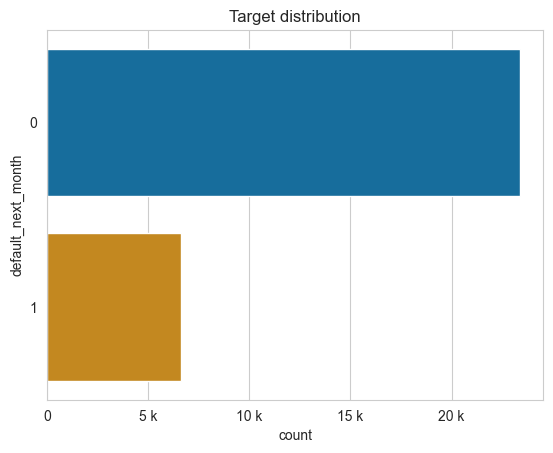

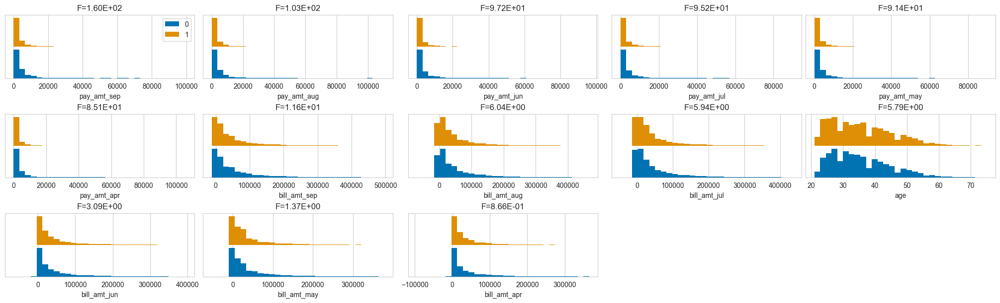

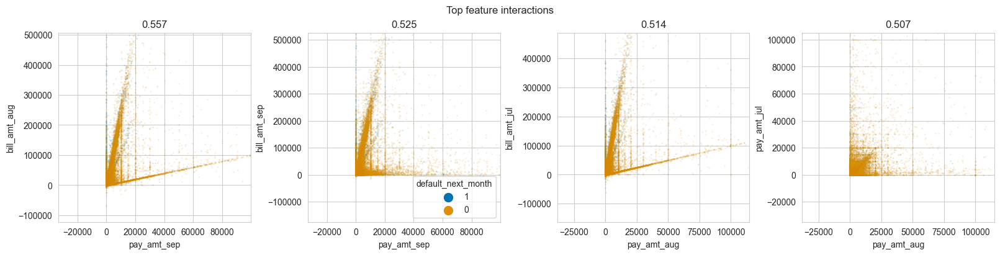

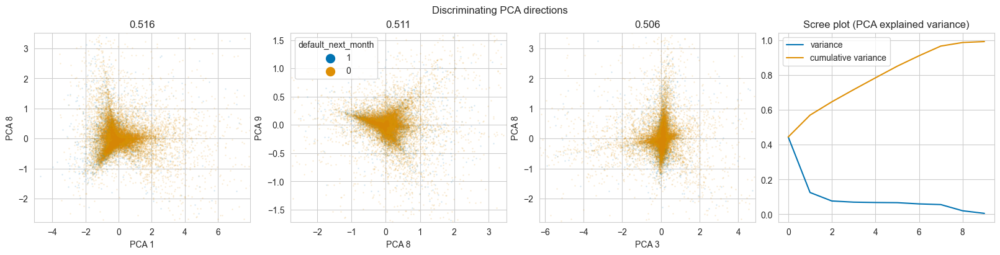

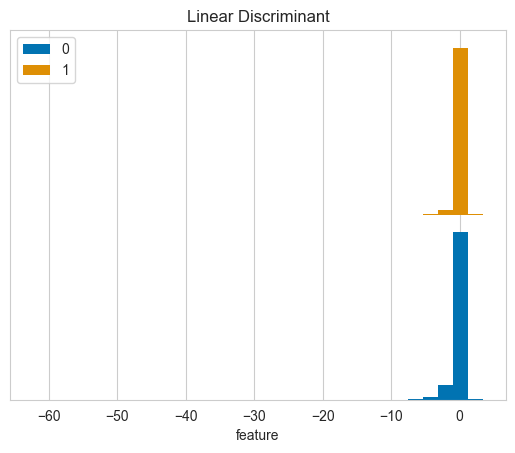

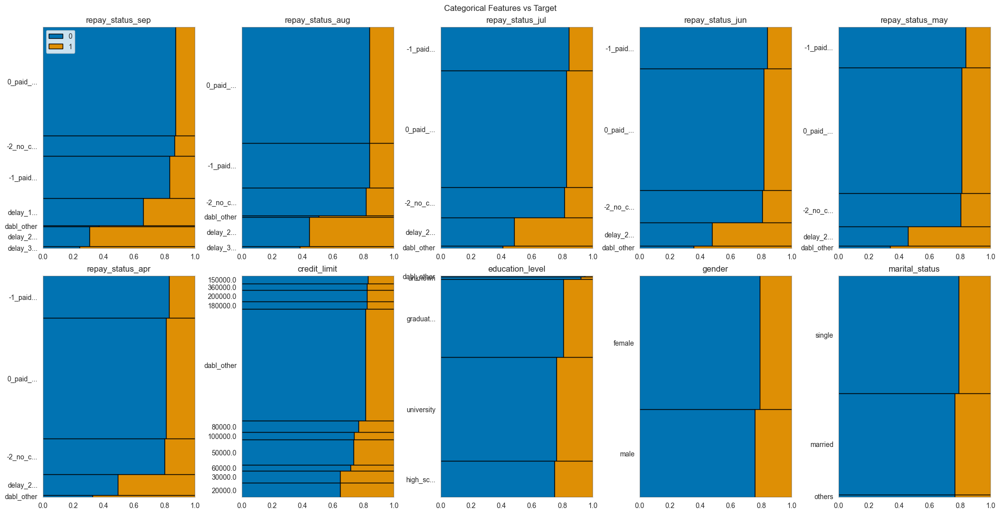

In [21]:
dabl.plot(df, "default_next_month")

In [25]:
from sklearn.model_selection import train_test_split

target = "default_next_month"
X = df.drop(columns=[target])
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)
sc = dabl.SimpleClassifier().fit(X_train, y_train)

Running DummyClassifier()
accuracy: 0.777 average_precision: 0.223 roc_auc: 0.500 recall_macro: 0.500 f1_macro: 0.437
=== new best DummyClassifier() (using recall_macro):
accuracy: 0.777 average_precision: 0.223 roc_auc: 0.500 recall_macro: 0.500 f1_macro: 0.437

Running GaussianNB()
accuracy: 0.276 average_precision: 0.236 roc_auc: 0.535 recall_macro: 0.521 f1_macro: 0.258
=== new best GaussianNB() (using recall_macro):
accuracy: 0.276 average_precision: 0.236 roc_auc: 0.535 recall_macro: 0.521 f1_macro: 0.258

Running MultinomialNB()
accuracy: 0.803 average_precision: 0.523 roc_auc: 0.755 recall_macro: 0.673 f1_macro: 0.687
=== new best MultinomialNB() (using recall_macro):
accuracy: 0.803 average_precision: 0.523 roc_auc: 0.755 recall_macro: 0.673 f1_macro: 0.687

Running DecisionTreeClassifier(class_weight='balanced', max_depth=1)
accuracy: 0.812 average_precision: 0.353 roc_auc: 0.621 recall_macro: 0.621 f1_macro: 0.642
Running DecisionTreeClassifier(class_weight='balanced', max_d

## Univariate analysis

Understand the distribution of numerical columns and find potential outliers


id


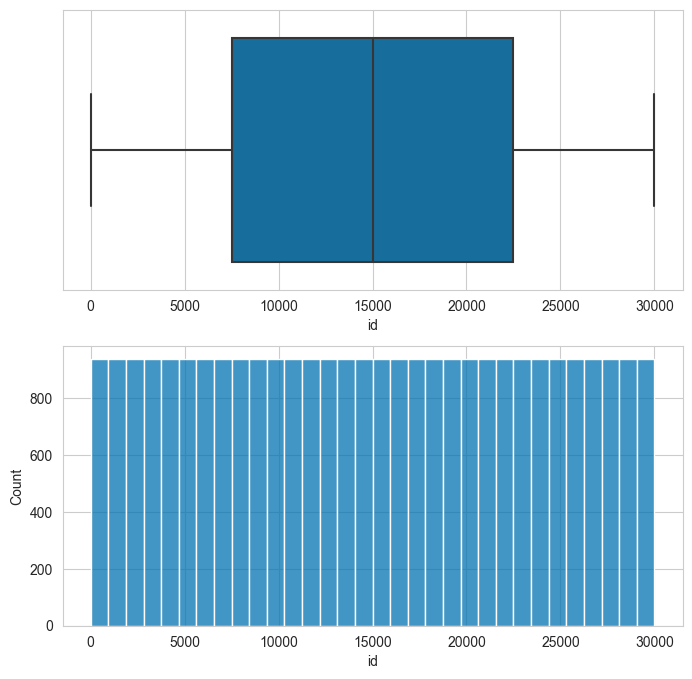

credit_limit


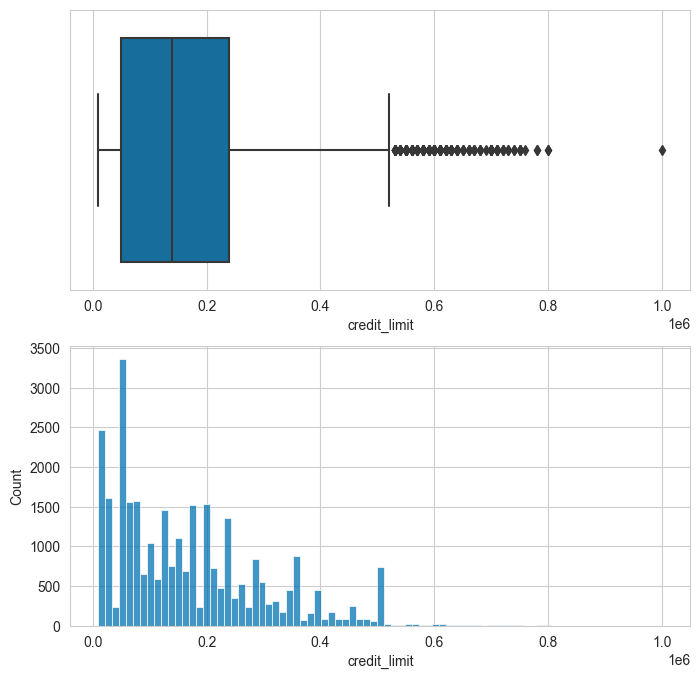

age


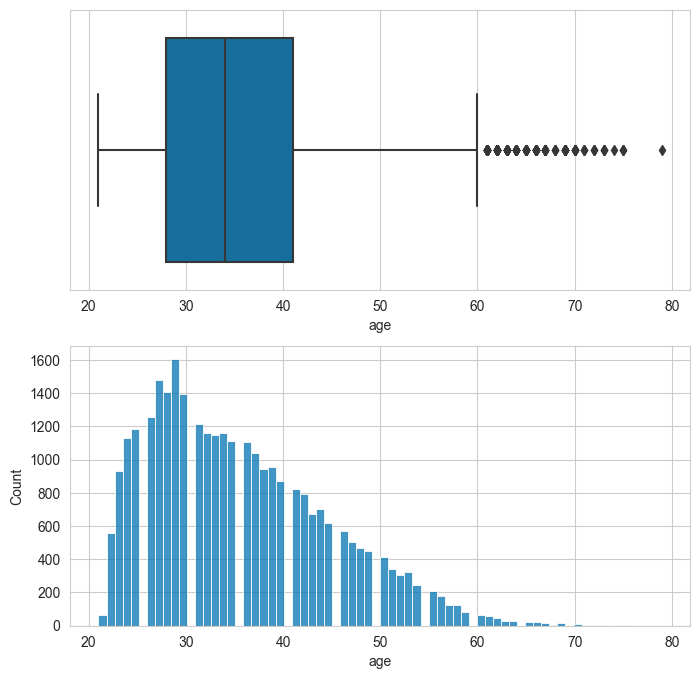

bill_amt_sep


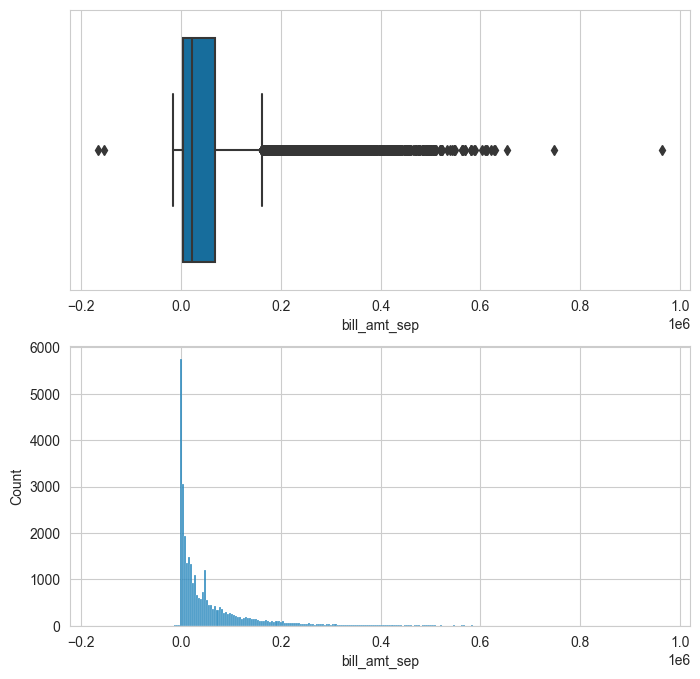

bill_amt_aug


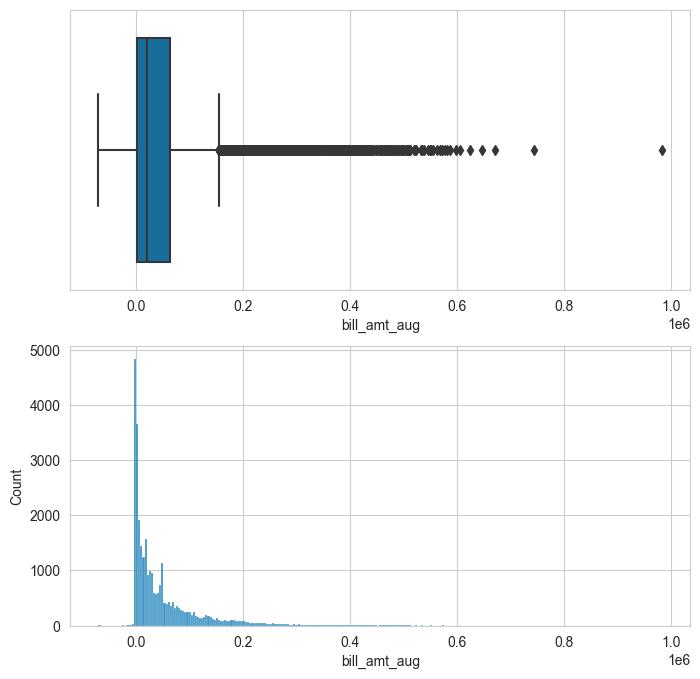

bill_amt_jul


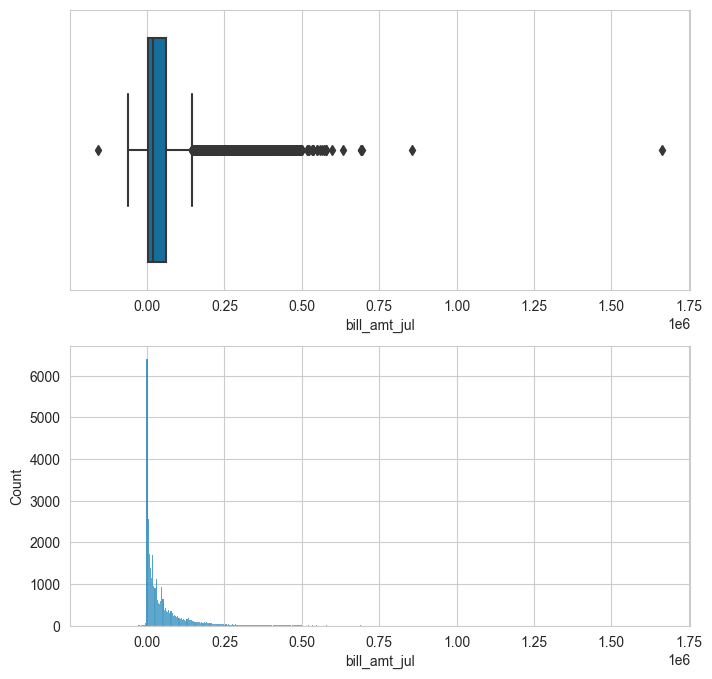

bill_amt_jun


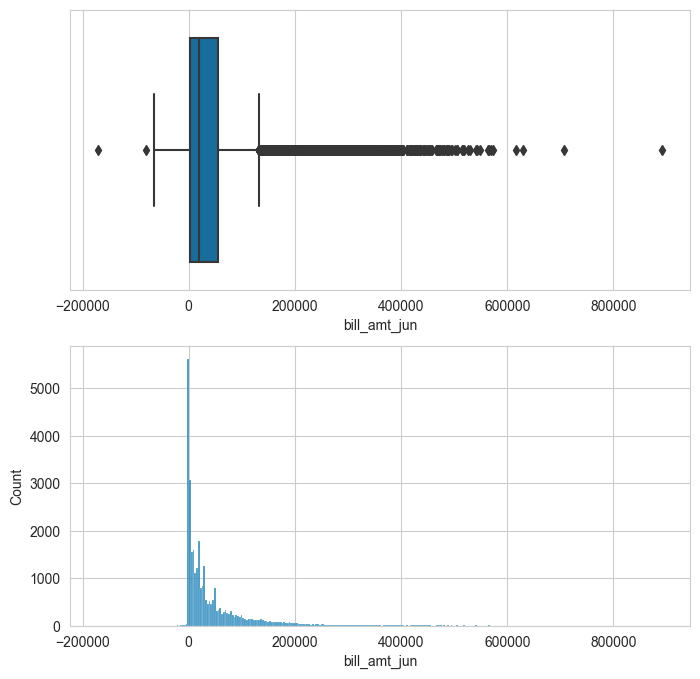

bill_amt_may


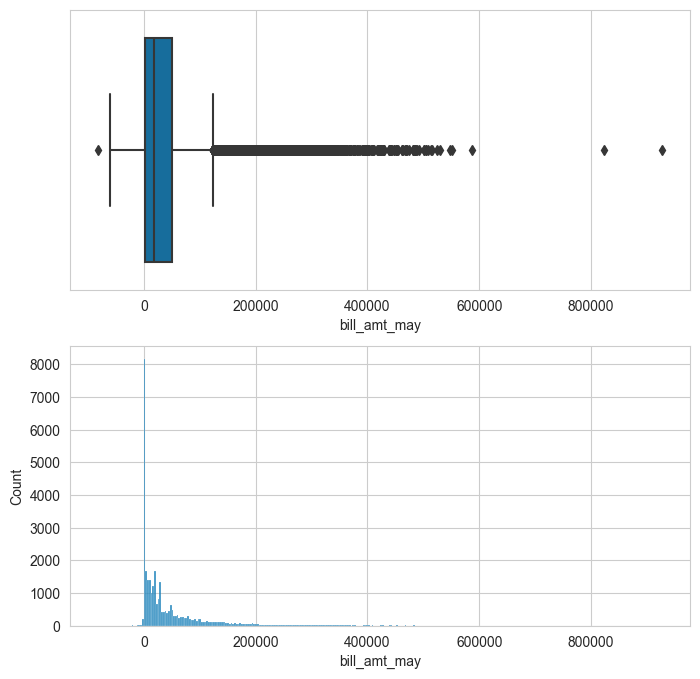

bill_amt_apr


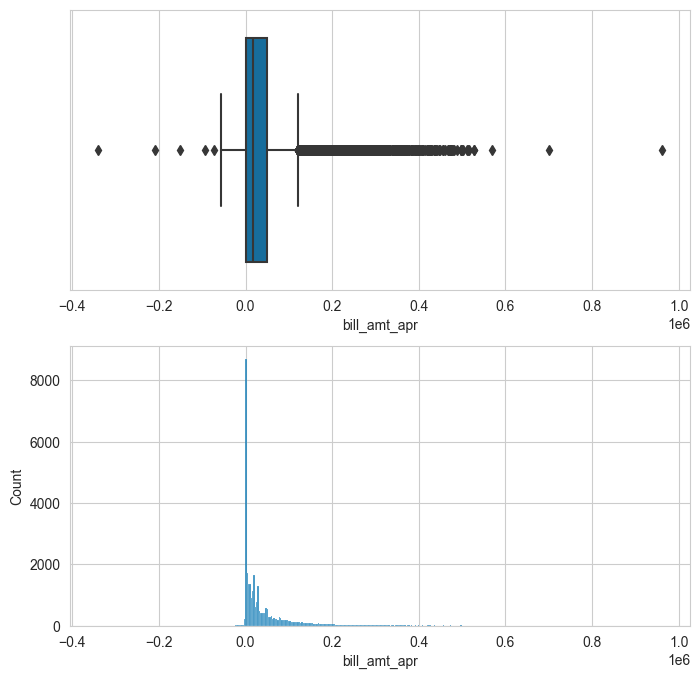

pay_amt_sep


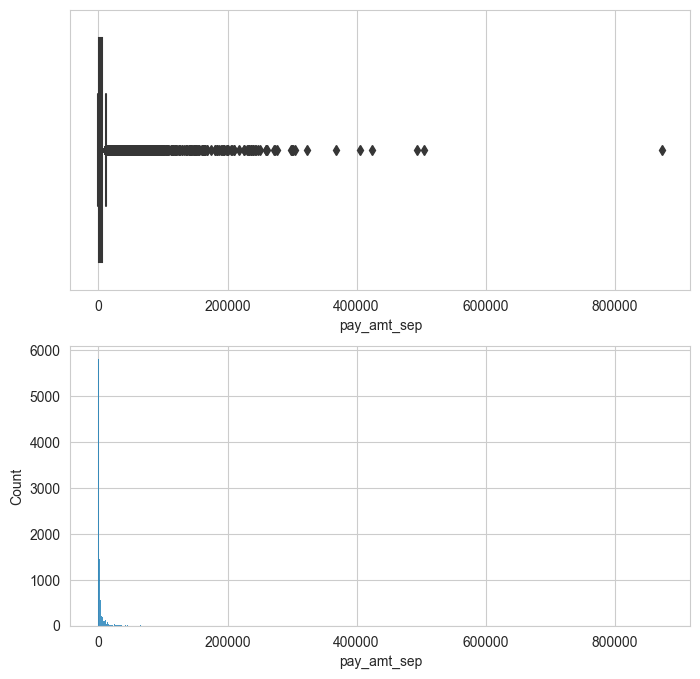

pay_amt_aug


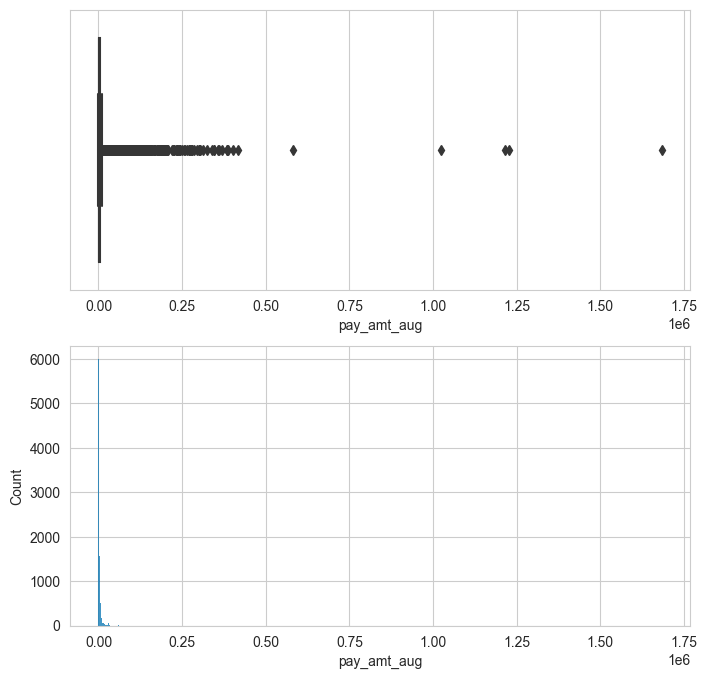

pay_amt_jul


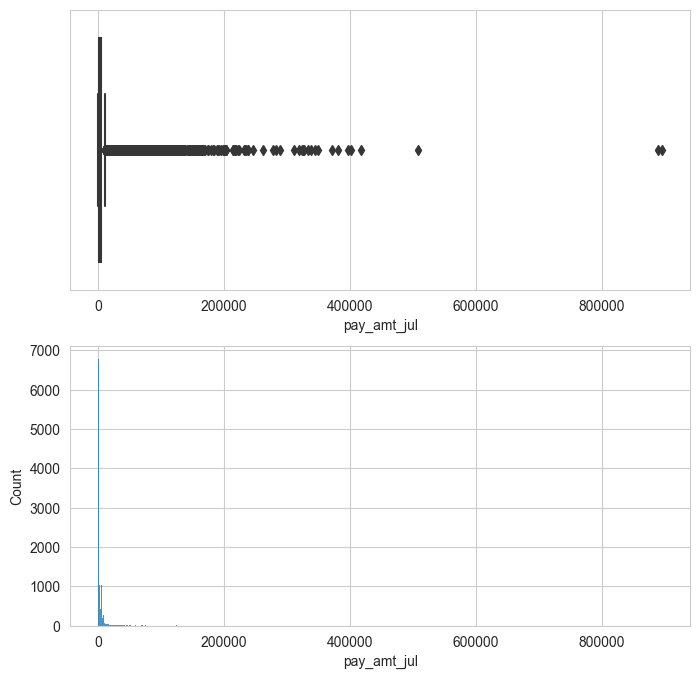

pay_amt_jun


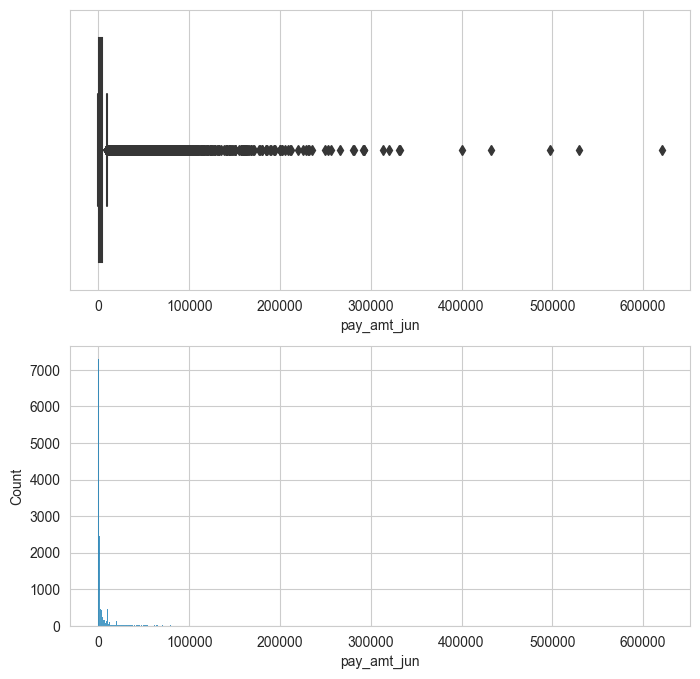

pay_amt_may


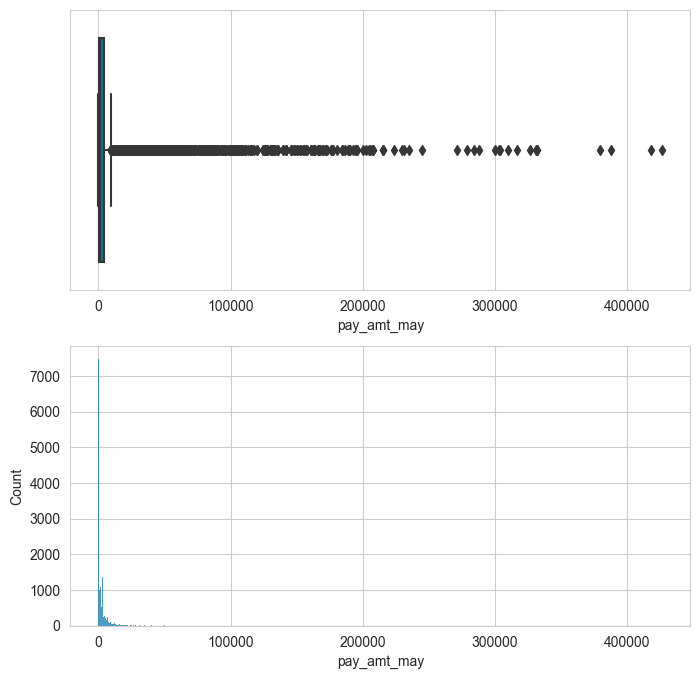

pay_amt_apr


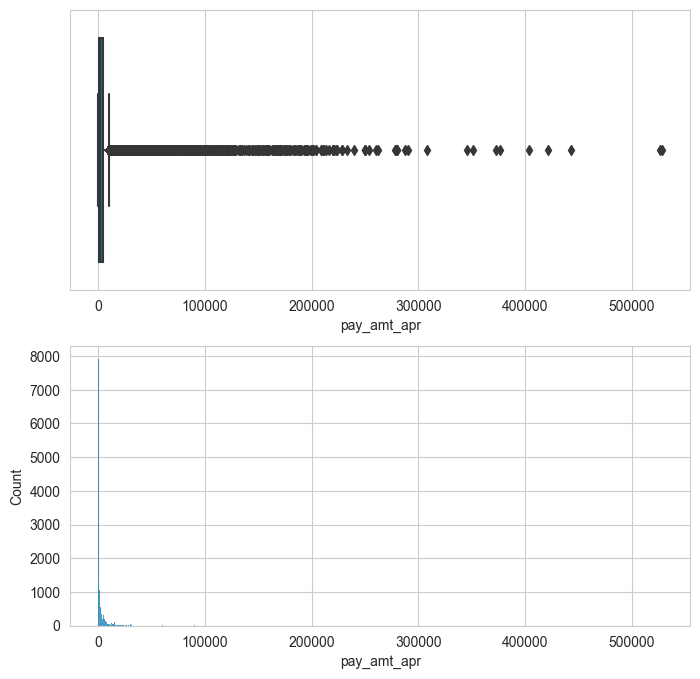

default_next_month


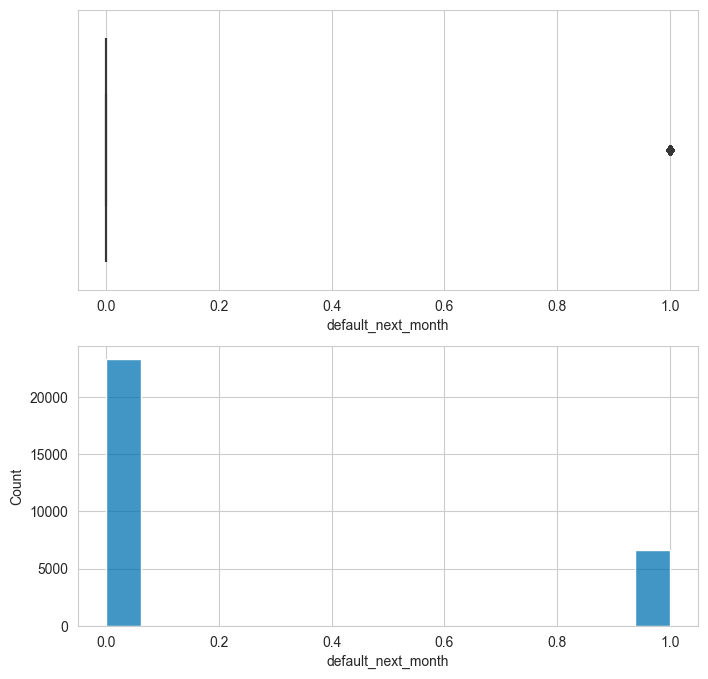

In [22]:
for colname, coltype in df.dtypes.items():
    if (coltype == "float64") or (coltype == "int64"):
        print(colname)
        # fig, ax = plt.subplots(1, 2, figsize=(16,4))
        fig, ax = plt.subplots(2, 1, figsize=(8, 8))
        sns.boxplot(data=df, x=colname, ax=ax[0])
        sns.histplot(data=df, x=colname, ax=ax[1])
        plt.show()